## Set-Up

In [1]:
import noisereduce as nr
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import librosa
import os
import copy
from IPython.display import Audio

import maad
from maad import sound, features, rois
from maad.rois import find_rois_cwt
from maad.util import plot_spectrogram

In [2]:
AUDIO_PATH = r"audio/salmon_1.WAV"

## Avoid Duplicate Sound Events

In [106]:
# This function groups events in df_chirp so that if events are closer than min_tbd to each other, they are considered part of a single event
def keepUnique(df_chirp, min_tbd = 0.5):
    df_unique_chirp = df_chirp.copy()
    last_event_max_t = - (min_tbd + 1)
    removal_list = []

    for index, event in df_chirp.iterrows():
        if event['min_t'] > (last_event_max_t + min_tbd):
            last_event_max_t = event['max_t']
            event_first_index = index
        else:
            removal_list.append(index)
            df_unique_chirp.loc[event_first_index, 'max_t'] = event['max_t']
    
    df_unique_chirp = df_unique_chirp.drop(removal_list).reset_index(drop=True)

    return df_unique_chirp

## Using maad's median equalizer

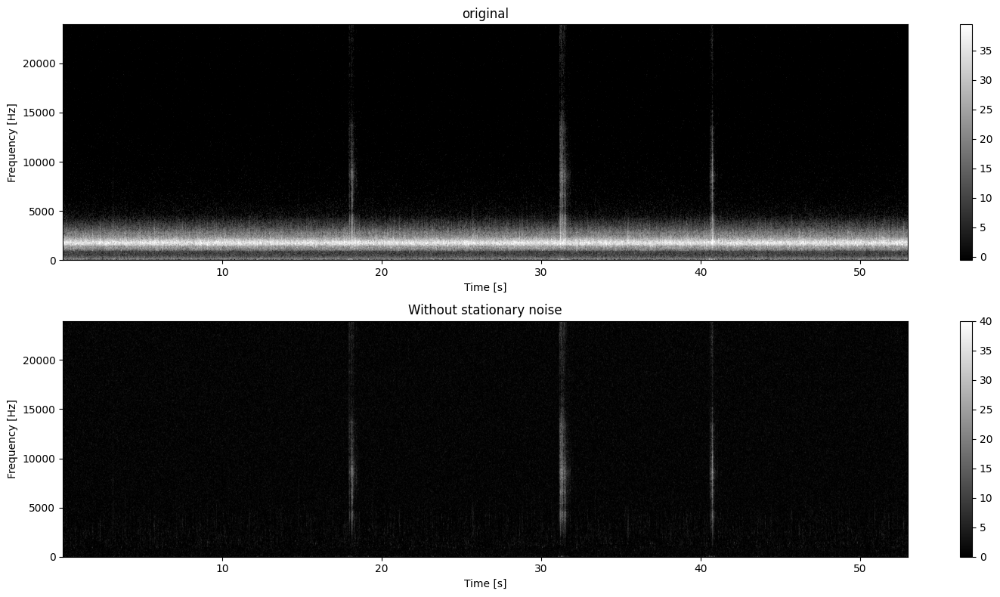

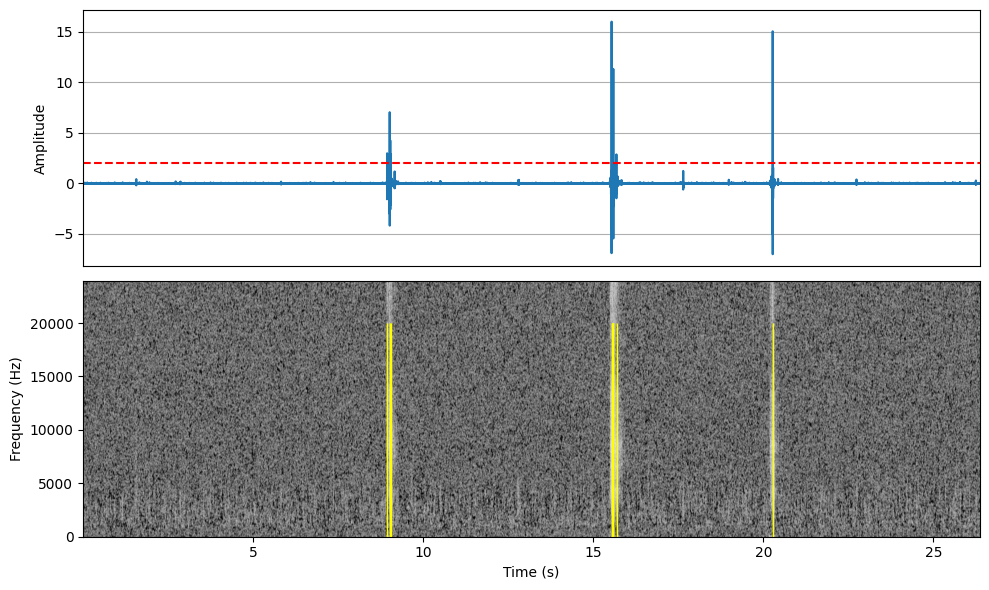

   min_f     min_t    max_f     max_t
0   20.0   8.94117  20000.0   9.05204
1   20.0  15.54454  20000.0  15.68729
2   20.0  20.28263  20000.0  20.28383


In [107]:
s, fs = maad.sound.load(AUDIO_PATH)
Sxx,tn,fn,ext = maad.sound.spectrogram (s, fs) 
Sxx_dB = maad.util.power2dB(Sxx) + 96

Sxx_noNoise = maad.sound.median_equalizer(Sxx)

Sxx_dB_noNoise =  maad.util.power2dB(Sxx_noNoise) 
fig, (ax1, ax2) = plt.subplots(2, 1)
maad.util.plot2d(Sxx_dB, ax=ax1, extent=ext, title='original', vmin=np.median(Sxx_dB), vmax=np.median(Sxx_dB)+40)
maad.util.plot2d(Sxx_dB_noNoise, ax=ax2, extent=ext, title='Without stationary noise',vmin=np.median(Sxx_dB_noNoise), vmax=np.median(Sxx_dB_noNoise)+40)
fig.set_size_inches(15,8)
fig.tight_layout() 

audio_signal = librosa.griffinlim(Sxx_dB_noNoise)
# Set threshold to 2
df_chirp = maad.rois.find_rois_cwt(audio_signal, fs, flims=(20,20000), tlen=0.001, th=2, display=True, figsize=(10,6))

print(keepUnique(df_chirp))

In [5]:
Audio(data=audio_signal, rate=fs)

## Using hand-made function A (Row-wise Threshold-based Removal )

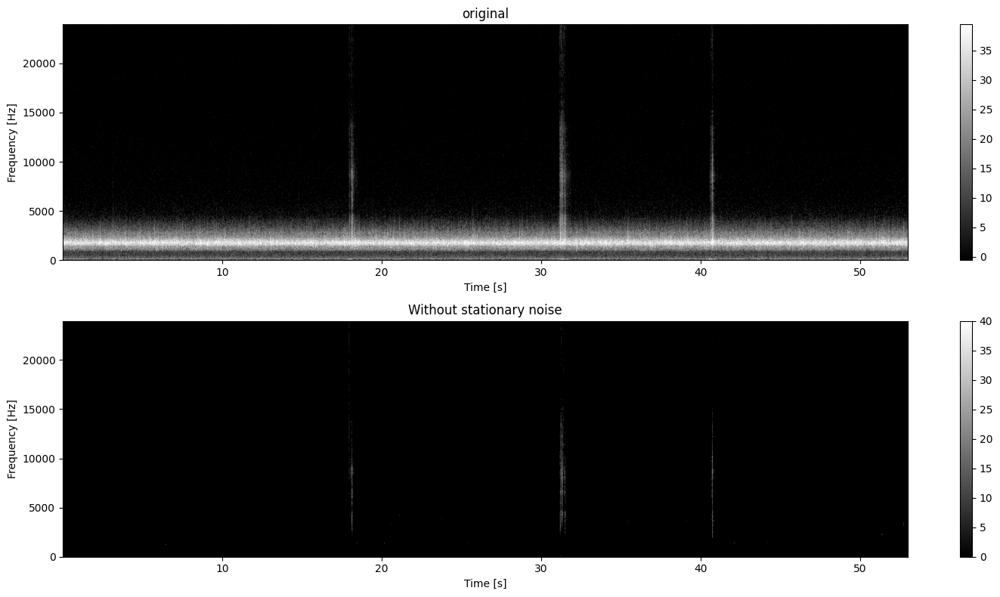

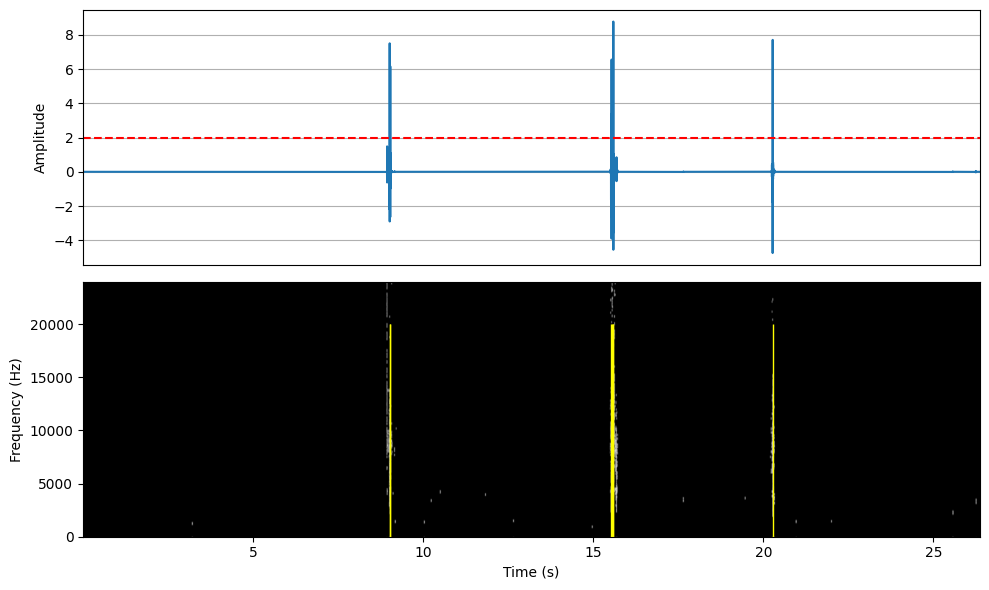

   min_f     min_t    max_f     max_t
0   20.0   9.01638  20000.0   9.03521
1   20.0  15.52875  20000.0  15.59633
2   20.0  20.28288  20000.0  20.28408


In [108]:
def hand_made_filter(input_dB_spec, std_num):

    # Get row-wise median and standard deviation
    spec_median = np.median(input_dB_spec, axis=1)
    spec_sd = np.std(input_dB_spec, axis=1)

    # Define a default value to replace the noise
    default_value = 0

    thresholds = spec_median + std_num * spec_sd

    # Cut off (by turning into default low value) anything below given number of standard deviations above row-wise mean
    denoised = copy.deepcopy(input_dB_spec)
    mask = input_dB_spec < thresholds[:, None]
    denoised[mask] = default_value
    
    return denoised

s, fs = maad.sound.load(AUDIO_PATH)
Sxx,tn,fn,ext = maad.sound.spectrogram (s, fs) 
Sxx_dB = maad.util.power2dB(Sxx) +96

Sxx_dB_noNoise =  hand_made_filter(Sxx_dB, 3) 

fig, (ax1, ax2) = plt.subplots(2, 1)
maad.util.plot2d(Sxx_dB, ax=ax1, extent=ext, title='original', vmin=np.median(Sxx_dB), vmax=np.median(Sxx_dB)+40)
maad.util.plot2d(Sxx_dB_noNoise, ax=ax2, extent=ext, title='Without stationary noise',vmin=np.median(Sxx_dB_noNoise), vmax=np.median(Sxx_dB_noNoise)+40)
fig.set_size_inches(15,8)
fig.tight_layout() 

audio_signal_2 = librosa.core.spectrum.griffinlim(Sxx_dB_noNoise)

# Set threshold to 2
df_chirp = maad.rois.find_rois_cwt(audio_signal_2, fs, flims=(20,20000), tlen=0.001, th=2, display=True, figsize=(10,6))

print(keepUnique(df_chirp))

In [18]:
Audio(data=audio_signal_2, rate=fs)

## Using hand-made function B (Column removal based on column mean)

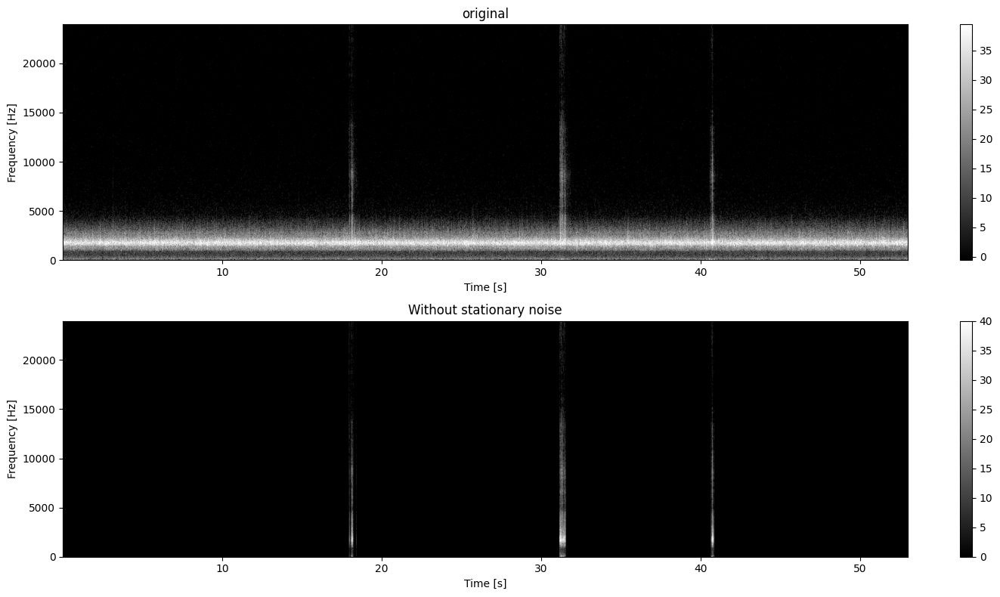

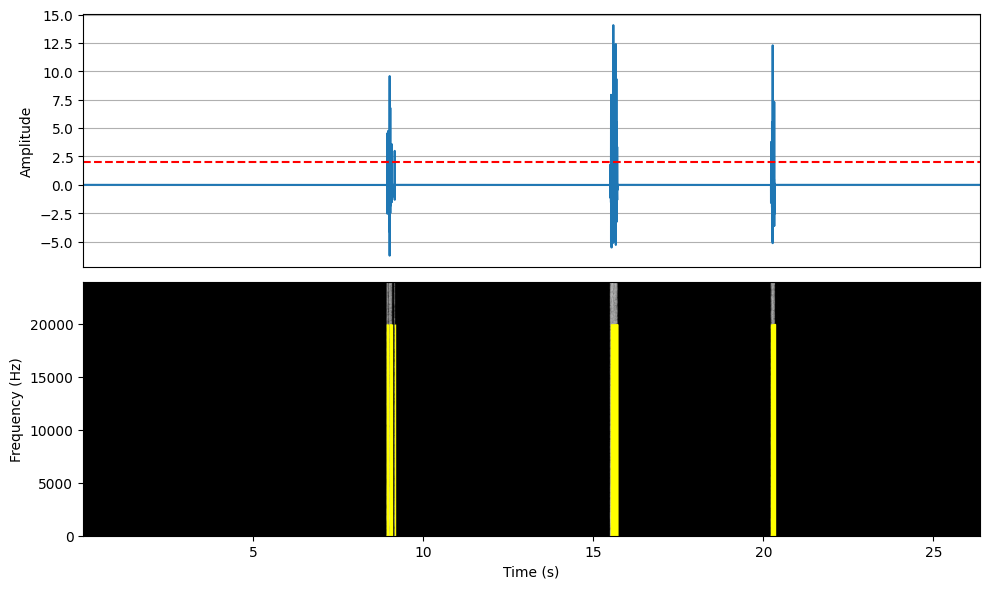

   min_f     min_t    max_f     max_t
0   20.0   8.94192  20000.0   9.16467
1   20.0  15.52667  20000.0  15.70950
2   20.0  20.23538  20000.0  20.32950


In [109]:
def hand_made_filter(input_dB_spec, std_num):

    # Get column-wise mean, and median & std of column_wise means
    spec_mean = np.mean(input_dB_spec, axis=0)
    spec_median = np.median(spec_mean)
    spec_sd = np.std(spec_mean)

    # Define a default value to replace the noise
    default_value = 0

    threshold = spec_median + std_num * spec_sd

    mask = np.array([spec_mean < threshold])
    mask = np.repeat(mask, len(input_dB_spec), axis=0)

    # Cut off (by turning into default low value) any column whose mean is below given number of standard deviations above row-wise mean
    denoised = copy.deepcopy(input_dB_spec)
    denoised[mask] = default_value
    
    return denoised

s, fs = maad.sound.load(AUDIO_PATH)
Sxx,tn,fn,ext = maad.sound.spectrogram (s, fs) 
Sxx_dB = maad.util.power2dB(Sxx) +96

Sxx_dB_noNoise =  hand_made_filter(Sxx_dB, 4) 

fig, (ax1, ax2) = plt.subplots(2, 1)
maad.util.plot2d(Sxx_dB, ax=ax1, extent=ext, title='original', vmin=np.median(Sxx_dB), vmax=np.median(Sxx_dB)+40)
maad.util.plot2d(Sxx_dB_noNoise, ax=ax2, extent=ext, title='Without stationary noise',vmin=np.median(Sxx_dB_noNoise), vmax=np.median(Sxx_dB_noNoise)+40)
fig.set_size_inches(15,8)
fig.tight_layout() 

audio_signal_2 = librosa.griffinlim(Sxx_dB_noNoise)

# Set threshold to 2
df_chirp = maad.rois.find_rois_cwt(audio_signal_2, fs, flims=(20,20000), tlen=0.001, th=2, display=True, figsize=(10,6))

print(keepUnique(df_chirp))

In [38]:
Audio(data=audio_signal_2, rate=fs)

## Using hand-made function C (combined A and B)

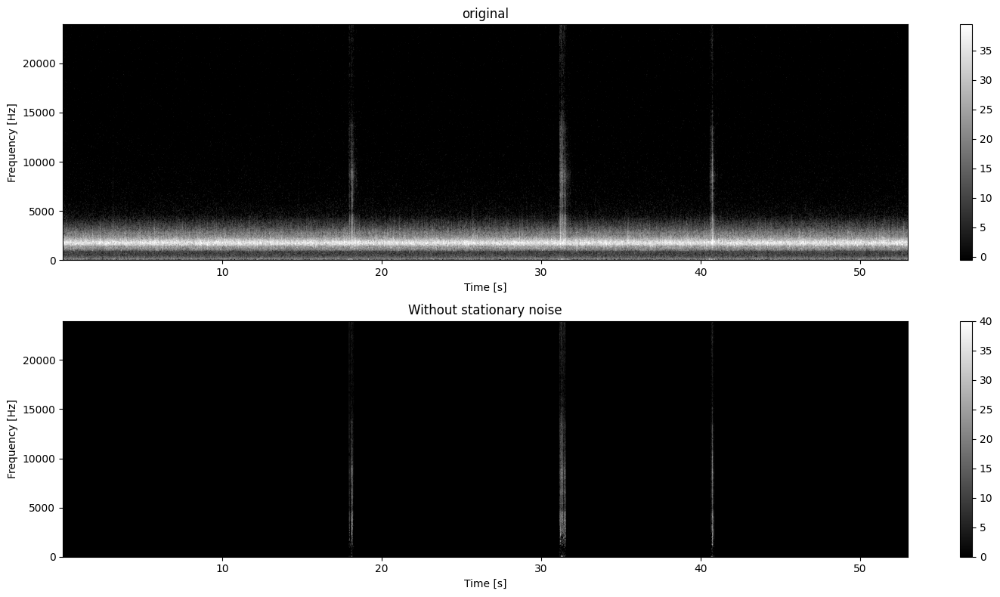

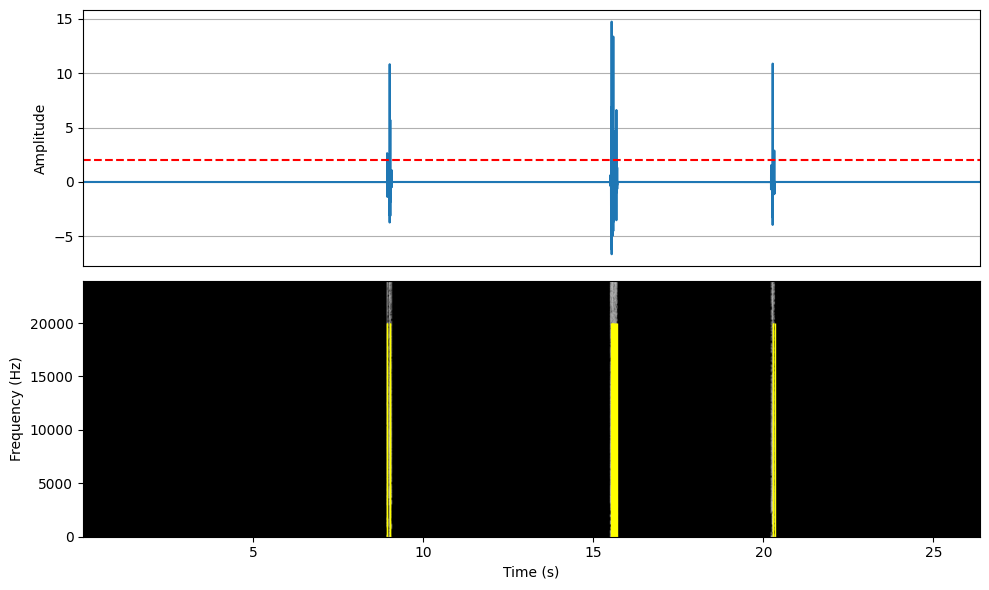

   min_f     min_t    max_f     max_t
0   20.0   8.94192  20000.0   9.03558
1   20.0  15.52950  20000.0  15.68725
2   20.0  20.28313  20000.0  20.33129


In [110]:
def hand_made_filter(input_dB_spec, std_num_1, std_num_2):

    # Get row-wise median and standard deviation
    spec_median = np.median(input_dB_spec, axis=1)
    spec_sd = np.std(input_dB_spec, axis=1)

    # Define a default value to replace the noise
    default_value = 0

    thresholds = spec_median + std_num_1 * spec_sd

    # Cut off (by turning into default low value) anything below given number of standard deviations above row-wise mean
    denoised = copy.deepcopy(input_dB_spec)
    mask = input_dB_spec < thresholds[:, None]
    denoised[mask] = default_value

    # Get column-wise mean, and median & std of column_wise means
    spec_mean = np.mean(denoised, axis=0)
    spec_median = np.median(spec_mean)
    spec_sd = np.std(spec_mean)

    threshold = spec_median + std_num_2 * spec_sd

    mask = np.array([spec_mean < threshold])
    mask = np.repeat(mask, len(denoised), axis=0)

    # Cut off (by turning into default low value) any column whose mean is below given number of standard deviations above row-wise mean
    denoised_2 = copy.deepcopy(denoised)
    denoised_2[mask] = default_value
    
    return denoised_2

s, fs = maad.sound.load(AUDIO_PATH)
Sxx,tn,fn,ext = maad.sound.spectrogram (s, fs) 
Sxx_dB = maad.util.power2dB(Sxx) +96

Sxx_dB_noNoise =  hand_made_filter(Sxx_dB, 1, 4) 

fig, (ax1, ax2) = plt.subplots(2, 1)
maad.util.plot2d(Sxx_dB, ax=ax1, extent=ext, title='original', vmin=np.median(Sxx_dB), vmax=np.median(Sxx_dB)+40)
maad.util.plot2d(Sxx_dB_noNoise, ax=ax2, extent=ext, title='Without stationary noise',vmin=np.median(Sxx_dB_noNoise), vmax=np.median(Sxx_dB_noNoise)+40)
fig.set_size_inches(15,8)
fig.tight_layout() 

audio_signal_3 = librosa.griffinlim(Sxx_dB_noNoise)

# Set threshold to 2
df_chirp = maad.rois.find_rois_cwt(audio_signal_3, fs, flims=(20,20000), tlen=0.001, th=2, display=True, figsize=(10,6))

print(keepUnique(df_chirp))

In [40]:
Audio(data=audio_signal_3, rate=fs)